In [208]:
import pandas as pd
import seaborn as sns

In [209]:
dados2 = pd.read_csv('data/flights3.csv')

In [296]:
dados = pd.read_csv('data/flights4.csv')

In [211]:
dados

,flight_id,airline,aircraft_type,schengen,origin,arrival_time,departure_time,day,year,is_holiday,delay
0,5,RG,Airbus A320,non-schengen,BYU,15.135172,19.135172,0,2010,False,44.552479
1,19,SR,Boeing 737,schengen,LZW,10.698807,13.698807,0,2010,False,30.931739
2,19,SR,Boeing 737,schengen,LZW,10.698807,13.698807,0,2010,False,12.522989
3,26,RG,Boeing 787,non-schengen,NNN,16.970906,19.970906,0,2010,False,38.306160
4,3,SR,Boeing 737,schengen,YOG,8.431066,11.431066,0,2010,False,18.484254
...,...,...,...,...,...,...,...,...,...,...,...
71170,16,SR,Airbus A320,schengen,BYU,9.424609,12.424609,364,2022,True,22.394235
71171,27,SR,Boeing 737,schengen,LZW,7.664314,10.664314,364,2022,True,42.723790
71172,1,SR,Boeing 737,non-schengen,GXN,16.742657,21.742657,364,2022,True,28.120589
71173,11,RG,Boeing 737,schengen,JRT,17.011918,21.011918,364,2022,True,88.847707


In [242]:
dados.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71175 entries, 0 to 71174
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   flight_id       71175 non-null  int64  
 1   airline         71175 non-null  object 
 2   aircraft_type   71175 non-null  object 
 3   schengen        71175 non-null  object 
 4   origin          71175 non-null  object 
 5   arrival_time    71175 non-null  float64
 6   departure_time  71175 non-null  float64
 7   day             71175 non-null  int64  
 8   year            71175 non-null  int64  
 9   is_holiday      71175 non-null  bool   
 10  delay           71175 non-null  float64
dtypes: bool(1), float64(3), int64(3), object(4)
memory usage: 5.5+ MB


In [244]:
dados['delay']

0        44.552479
1        30.931739
2        12.522989
3        38.306160
4        18.484254
           ...    
71170    22.394235
71171    42.723790
71172    28.120589
71173    88.847707
71174    77.445042
Name: delay, Length: 71175, dtype: float64

In [248]:
from datetime import datetime, timedelta

In [255]:
!pip install plotly

  Using cached tenacity-8.2.2-py3-none-any.whl (24 kB)


In [265]:
def convert_day_to_date(day, year):
    base_date = datetime(year=year, month=1, day=1)
    target_date = base_date + timedelta(days=day)
    return target_date.strftime('%Y-%m-%d')  # Format the date as desired

# Convert 'day' column to regular dates
dados['date'] = dados.apply(lambda row: convert_day_to_date(row['day'], row['year']), axis=1)

In [256]:
dados

,flight_id,airline,aircraft_type,schengen,origin,arrival_time,departure_time,day,year,is_holiday,delay,date
0,5,RG,Airbus A320,non-schengen,BYU,15.135172,19.135172,0,2010,False,44.552479,2010-01-01
1,19,SR,Boeing 737,schengen,LZW,10.698807,13.698807,0,2010,False,30.931739,2010-01-01
2,19,SR,Boeing 737,schengen,LZW,10.698807,13.698807,0,2010,False,12.522989,2010-01-01
3,26,RG,Boeing 787,non-schengen,NNN,16.970906,19.970906,0,2010,False,38.306160,2010-01-01
4,3,SR,Boeing 737,schengen,YOG,8.431066,11.431066,0,2010,False,18.484254,2010-01-01
...,...,...,...,...,...,...,...,...,...,...,...,...
71170,16,SR,Airbus A320,schengen,BYU,9.424609,12.424609,364,2022,True,22.394235,2022-12-31
71171,27,SR,Boeing 737,schengen,LZW,7.664314,10.664314,364,2022,True,42.723790,2022-12-31
71172,1,SR,Boeing 737,non-schengen,GXN,16.742657,21.742657,364,2022,True,28.120589,2022-12-31
71173,11,RG,Boeing 737,schengen,JRT,17.011918,21.011918,364,2022,True,88.847707,2022-12-31


In [257]:
import plotly.express as px

In [266]:
px.line(dados[dados['year']==2018], x = 'date', y = 'delay', color = 'airline')

In [298]:
px.histogram(dados, x = 'delay')

In [297]:
px.histogram(dados, x = 'delay', color = 'airline')

In [299]:
px.histogram(dados, x = 'delay', color = 'aircraft_type')

In [300]:
px.histogram(dados, x = 'delay', color = 'origin')

In [301]:
dados['airline'].value_counts()

HX    45064
EJ    14167
AJ    11944
Name: airline, dtype: int64

In [213]:
dados2.groupby('aircraft_type')['delay'].mean()

aircraft_type
Airbus A320     11.410958
Airbus A330     33.885209
Boeing 737      18.331183
Boeing 777      26.459329
Boeing 787      19.319212
Embraer E175    41.446056
Name: delay, dtype: float64

In [214]:
dados2.groupby('origin')['delay'].mean()

origin
CLY    41.317551
GQL    28.355456
JTI    -4.661267
JYW    41.912650
MFS    41.911285
QKU    26.877769
QNK    14.704420
SQZ    26.144730
TLY    41.399488
UEF    19.637423
Name: delay, dtype: float64

In [215]:
dados.groupby('origin')['delay'].mean()

origin
BYU    12.671492
ESB    38.448019
GXN     9.075506
JRT    24.759992
LZW     2.374455
NBI    21.873546
NNN    23.106483
PWR    -2.486139
YKZ    11.725588
YOG    -2.088816
Name: delay, dtype: float64

In [216]:
dados.groupby('aircraft_type')['delay'].mean()

aircraft_type
Airbus A320    14.619329
Airbus A330    18.453126
Boeing 737     18.105591
Boeing 777     28.754074
Boeing 787      6.050397
Name: delay, dtype: float64

In [317]:
dados.groupby('airline')['delay'].mean()

airline
AJ    49.755209
EJ     4.683157
HX    22.270119
Name: delay, dtype: float64

c:\Users\Joaom\anaconda3\envs\principal\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='airline', ylabel='count'>

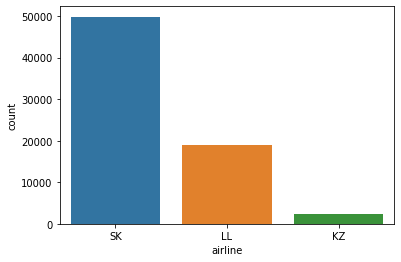

In [273]:
sns.countplot(dados['airline'])

In [219]:
dados['aircraft_type'].value_counts()

Boeing 737     30849
Airbus A320    18962
Boeing 787     11753
Boeing 777      7299
Airbus A330     2312
Name: aircraft_type, dtype: int64

c:\Users\Joaom\anaconda3\envs\principal\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='aircraft_type', ylabel='count'>

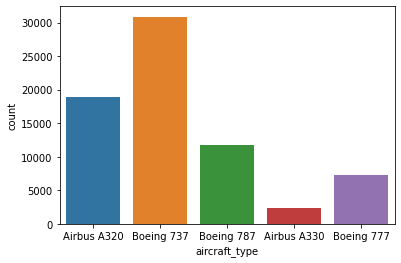

In [220]:
sns.countplot(dados['aircraft_type'])

In [221]:
dados['origin'].value_counts()

NNN    16618
BYU    11876
GXN     9463
JRT     7209
NBI     7041
YOG     4776
ESB     4744
LZW     4733
YKZ     2435
PWR     2280
Name: origin, dtype: int64

c:\Users\Joaom\anaconda3\envs\principal\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='origin', ylabel='count'>

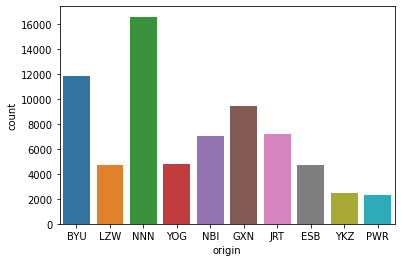

In [222]:
sns.countplot(dados['origin'])

In [223]:
dados['schengen'].value_counts(normalize= True)

schengen        0.734766
non-schengen    0.265234
Name: schengen, dtype: float64

c:\Users\Joaom\anaconda3\envs\principal\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='schengen', ylabel='count'>

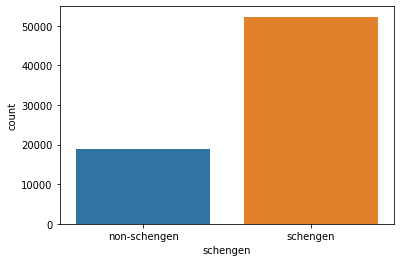

In [224]:
sns.countplot(dados['schengen'])

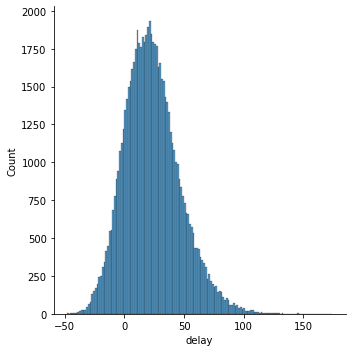

In [316]:
sns.displot(dados['delay'])

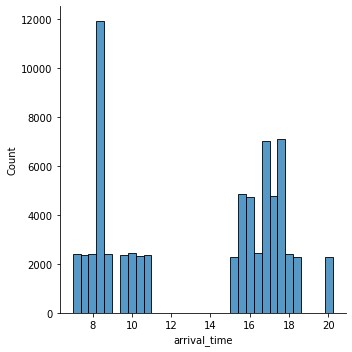

In [226]:
sns.displot(dados['arrival_time'])

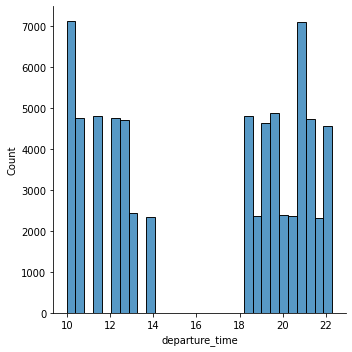

In [227]:
sns.displot(dados['departure_time'])

c:\Users\Joaom\anaconda3\envs\principal\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='delay'>

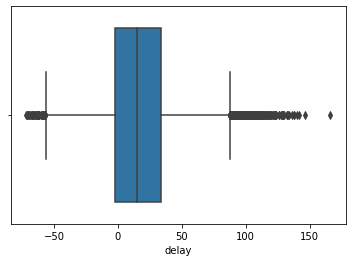

In [228]:
sns.boxplot(dados['delay'])

In [234]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split

In [307]:
categorical_vars = ['airline', 'aircraft_type', 'origin']

# Perform one-hot encoding
df_encoded_4 = pd.get_dummies(dados, columns=categorical_vars, dtype=int)

df_encoded_4['is_holiday'] = df_encoded_4['is_holiday'].map({False: 0, True: 1})
df_encoded_4['schengen'] = df_encoded_4['schengen'].map({'non-schengen': 0, 'schengen': 1})
df_encoded_4['is_weekend'] = df_encoded_4['day'].apply(lambda day: day % 7 == 0 or day % 7 == 6)

X = df_encoded_4.drop(['flight_id', 'day', 'year','departure_time', 'delay'], axis=1)
y = df_encoded_4['delay']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42) # random_state=42

In [311]:
X_test

,schengen,arrival_time,is_holiday,airline_AJ,airline_EJ,airline_HX,aircraft_type_Airbus A320,aircraft_type_Airbus A330,aircraft_type_Boeing 737,aircraft_type_Boeing 777,...,origin_EXD,origin_HQL,origin_KVJ,origin_MEH,origin_QRA,origin_QVJ,origin_SWB,origin_XFM,origin_XOO,is_weekend
40337,0,8.478585,0,0,0,1,1,0,0,0,...,1,0,0,0,0,0,0,0,0,False
9354,0,16.815060,0,0,0,1,0,0,1,0,...,0,0,0,0,1,0,0,0,0,True
64321,1,7.690123,0,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,True
24993,0,8.478585,0,0,0,1,1,0,0,0,...,1,0,0,0,0,0,0,0,0,False
10688,1,9.725501,0,0,0,1,1,0,0,0,...,0,0,0,0,1,0,0,0,0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28472,0,8.478585,0,0,0,1,1,0,0,0,...,1,0,0,0,0,0,0,0,0,False
17902,1,14.462317,0,0,1,0,1,0,0,0,...,0,0,0,1,0,0,0,0,0,True
43418,1,15.971708,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,False
8943,0,16.237355,0,0,0,1,0,1,0,0,...,0,0,0,1,0,0,0,0,0,True


In [312]:
y_test

40337    19.633080
9354     60.149267
64321    -0.469444
24993    25.255764
10688     0.298411
           ...    
28472    25.813842
17902    10.028839
43418    20.983450
8943     25.669825
16284    24.730046
Name: delay, Length: 14235, dtype: float64

In [236]:
from sklearn.ensemble import RandomForestRegressor

In [319]:
from sklearn.feature_selection import RFE
from sklearn.pipeline import Pipeline

model = RandomForestRegressor()
rfe = RFE(model)
pipeline = Pipeline(steps=[('s',rfe),('m',model)])
pipeline.fit(X_train, y_train)

y_pred = pipeline.predict(X_test)

mae = mean_absolute_error(y_test, y_pred)
print('Mean Absolute Error:', mae)

mse = mean_squared_error(y_test, y_pred)
print('Mean Squared Error:', mse)

rmse = mean_squared_error(y_test, y_pred, squared=False)
print('Root Mean Squared Error:', rmse)

r2 = r2_score(y_test, y_pred)
print('R-squared:', r2)

Mean Absolute Error: 8.947806380890166
Mean Squared Error: 134.0637595489796
Root Mean Squared Error: 11.578590568328236
R-squared: 0.7579472694897713


In [324]:
from sklearn.ensemble import GradientBoostingRegressor

In [322]:
model = RandomForestRegressor()
model.fit(X_train, y_train)

y_pred = model.predict(X_train)

mae = mean_absolute_error(y_train, y_pred)
print('Mean Absolute Error:', mae)

mse = mean_squared_error(y_train, y_pred)
print('Mean Squared Error:', mse)

rmse = mean_squared_error(y_train, y_pred, squared=False)
print('Root Mean Squared Error:', rmse)

r2 = r2_score(y_train, y_pred)
print('R-squared:', r2)

Mean Absolute Error: 8.855651465142001
Mean Squared Error: 130.97771430333194
Root Mean Squared Error: 11.444549545671595
R-squared: 0.7625554641929851


In [325]:
model_boosting = GradientBoostingRegressor()
model_boosting.fit(X_train, y_train)

y_pred = model_boosting.predict(X_test)

mae = mean_absolute_error(y_test, y_pred)
print('Mean Absolute Error:', mae)

mse = mean_squared_error(y_test, y_pred)
print('Mean Squared Error:', mse)

rmse = mean_squared_error(y_test, y_pred, squared=False)
print('Root Mean Squared Error:', rmse)

r2 = r2_score(y_test, y_pred)
print('R-squared:', r2)

Mean Absolute Error: 8.958892979649454
Mean Squared Error: 134.37420100471957
Root Mean Squared Error: 11.591988656167654
R-squared: 0.7573867660227775


In [327]:
!python -m pip install statsmodels

In [332]:
px.scatter(x = y_test, y = y_pred, trendline = 'ols', trendline_color_override = 'red',opacity = 0.2)

In [333]:
px.scatter(x = y_pred, y = (y_pred - y_test), trendline = 'ols', trendline_color_override = 'red',opacity = 0.2)

In [239]:
import seaborn as sns

In [284]:
from scipy.stats import skewnorm
import numpy as np

In [290]:
a = 5

In [283]:
r = skewnorm.rvs(a, size=1000)

In [286]:
import matplotlib.pyplot as plt

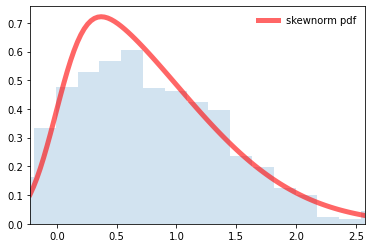

In [291]:
fig, ax = plt.subplots(1, 1)
x = np.linspace(skewnorm.ppf(0.01, a),
                skewnorm.ppf(0.99, a), 100)
ax.plot(x, skewnorm.pdf(x, a),
       'r-', lw=5, alpha=0.6, label='skewnorm pdf')
ax.hist(r, density=True, bins='auto', histtype='stepfilled', alpha=0.2)
ax.set_xlim([x[0], x[-1]])
ax.legend(loc='best', frameon=False)
plt.show()